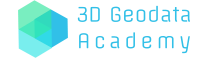

Created by Florent Poux. Licence MIT.
Members of the [3D Geodata Academy](https://learngeodata.eu) enrolled in a Course can use the code with Privileged IP Rights. 

*   To reuse in your project, please tag me on [Linkedin](https://www.linkedin.com/in/florent-poux-point-cloud/), [Medium](https://medium.com/@florentpoux) or [Twitter](https://twitter.com/PouxPointCloud).
*   Have fun with this notebook that you can very simply run (ctrl+Enter) !
*   The first time thought, it will ask you to get a key for it to be able to acces your Google drive folders if you want to work all remotely.
*   Simply accept, and then change the input path by the folder path containing your data, on Google Drive.

Enjoy!

# Step 0: Mesh To Point Cloud

* READ MESH FILE

In [10]:
!rm -rf /content/mesh2pointcloud
!git clone https://github.com/neerajtiwari360/mesh2pointcloud.git
!pip install trimesh open3d

Cloning into 'mesh2pointcloud'...
remote: Enumerating objects: 19, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 19 (delta 0), reused 16 (delta 0), pack-reused 0
Unpacking objects: 100% (19/19), done.


In [36]:
import numpy as np
import trimesh
import open3d as o3d

# Load the OBJ and MTL files
scene = trimesh.load("/content/mesh2pointcloud/asset/vollyball/mesh.obj")

In [37]:
  mesh = o3d.geometry.TriangleMesh()
  mesh.vertices = o3d.utility.Vector3dVector(scene.vertices)
  mesh.triangles = o3d.utility.Vector3iVector(scene.faces)
  print(mesh)

TriangleMesh with 29149 points and 31776 triangles.


In [38]:
scene.show()

* CONVERT INTO POINT CLOUD

# Step 1 & 2: Setting up the environment and loading the data

In [ ]:
#This code snippet allows to use data directly from your Google drives files.
#If you want to use a shared folder, just add the folder to your drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [41]:
# http://www.open3d.org/docs/release/getting_started.html
!pip install open3d

#libraries used
import numpy as np
import open3d as o3d #conda install -c open3d-admin open3d
import laspy as lp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


ModuleNotFoundError: ignored

In [ ]:
#create paths and load data
input_path="gdrive/My Drive/_MEDIUM/DATA/Point Cloud Sample/"
dataname="heerlen_table.las"

point_cloud=lp.read(input_path+dataname)
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(np.vstack((point_cloud.x, point_cloud.y, point_cloud.z)).transpose())
pcd.colors = o3d.utility.Vector3dVector(np.vstack((point_cloud.red, point_cloud.green, point_cloud.blue)).transpose()/65535)

# Step 3: Creating the voxel grid

In [ ]:
vsize=max(pcd.get_max_bound()-pcd.get_min_bound())*0.005
vsize=round(vsize,4)
        
voxel_grid=o3d.geometry.VoxelGrid.create_from_point_cloud(pcd,voxel_size=vsize)
bounds=voxel_grid.get_max_bound()-voxel_grid.get_min_bound()

# o3d.visualization.draw_geometries([voxel_grid])


# Step 4: Creating the cube voxels

In [ ]:
voxels=voxel_grid.get_voxels()
vox_mesh=o3d.geometry.TriangleMesh()
for v in voxels:
    cube=o3d.geometry.TriangleMesh.create_box(width=1, height=1, depth=1)
    cube.paint_uniform_color(v.color)
    cube.translate(v.grid_index, relative=False)
    vox_mesh+=cube

# Step 5: Exporting the voxels as one mesh

In [ ]:
vox_mesh.translate([0.5,0.5,0.5], relative=True)
vox_mesh.scale(vsize, [0,0,0])

vox_mesh.merge_close_vertices(0.0000001)
# T=np.array([[1, 0, 0, 0],[0, 0, 1, 0],[0, -1, 0, 0],[0, 0, 0, 1]])

vox_mesh.translate(voxel_grid.origin, relative=True)

o3d.io.write_triangle_mesh(input_path+"voxel_mesh_heerlen_rotated_v2.ply", vox_mesh.transform(T))


# BONUS: Small drawing function for Colab

In [ ]:
from mpl_toolkits import mplot3d

pc=np.asarray(pcd.points)
ax = plt.axes(projection='3d')
ax.scatter(pc[:,0], pc[:,1], pc[:,2], c = np.asarray(pcd.colors), s=0.01)
plt.show()